# PDX Tumors from Byers/Carl gay


In [1]:
import mazebox as mb
import scvelo as scv
import scanpy as sc
import os.path as op
import pandas as pd
import numpy as np
import dropkick as dk

# Preprocessing

## Read in Files

In [2]:
indir = "../data/loom/SC68"

samples = ['SC68.LB19002_GT19-03882_SI-GA-C4_S7_L007','SC68cr.LB19003_GT19-05072_S1_L001']
[a1,a2] = [mb.pp.read_loom(sample, indir) for sample in samples]


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


## Filter and concatenate

In [3]:
tfs = ['SP100', 'FOSL1', 'HES1', 'NFKBIZ', 'RELB', 'EPAS1', 'BCL3', 'REST', 'SP110', 'NFKB2', 'TEAD2', 'HMG20B', 'SIX5',
       'RARG', 'TEAD4', 'ZNF217', 'SP140L', 'SOX18', 'HOXC13', 'STAT6', 'ETV4', 'KLF2', 'MITF', 'NR0B2', 'ASCL1', 'ZBTB7C', 'ELF3',
       'RORC', 'FOXA2', 'ETS2','TOX3', 'XBP1', 'ST18', 'FOXA1', 'OVOL2', 'ZNF664', 'TBX10', 'PROX1', 'ETV6', 'CEBPD', 'TFCP2L1', 'FOXJ3',
       'ZNF407', 'ZNF511','ZNF396', 'RBPJ', 'ZSCAN31', 'HOXB5', 'ZNF3', 'TSHZ2', 'ZBTB16', 'ZNF10', 'FLI1', 'GATA4', 'NR0B1', 'NHLH1',
       'NEUROD6', 'ZNF581', 'TCF15', 'LYAR', 'ISL2', 'OLIG2', 'NEUROD1', 'INSM1', 'PAX5', 'SP6', 'MYT1', 'HES6', 'ZNF24', 'ISL1', 'ZNF397',
       'SOX11', 'ZNF253', 'SMAD4', 'RBP1', 'ONECUT2', 'ZNF711', 'DLX5', 'GRIP1', 'ZNF157', 'ZNF713', 'ZNF136', 'FOXN4', 'PATZ1', 'ZNF491',
       'ZBTB21', 'KLF12', 'ZNF501', 'ZNF785', 'CXXC1', 'ZNF324', 'ZNF764', 'ZBTB18', 'KAT8', 'ZNF334', 'POU4F1', 'ZNF250', 'ZNF132',
       'SALL2', 'DLX6', 'MBD1','SOX1', 'ZFP3', 'ZNF543', 'POU2F1', 'NONO', 'SMAD9', 'ZKSCAN2', 'TCF12', 'VEZF1', 'TOX', 'BHLHE22', 'MTA1',
       'TCF3', 'SCRT2', 'RFX7','NHLH2', 'SCRT1', 'RCOR2', 'PURG', 'TBPL1', 'TCF4', 'EBF1', 'ZNF749', 'NEUROD2', 'ZNF423', 'BACH2', 'GLI1',
       'ZFP64','NKX2-1', 'MYC', 'YAP1', 'POU2F3', 'MYCL', 'MYCN', 'ASCL2', 'AVIL', 'CHAT', 'GFI1B',
      'CHGA','EPCAM']


Dropkick is a tool to get rid of empty and low-quality droplets based on ambient reads. It should be applied to each sample separately, so we will apply first and then concantenate the data into one AnnData object.

In [4]:
batch_categories = ['Sensitive','Relapsed']
batch_key = 'tumors'

adata = a1.concatenate(a2, batch_key='tumors')
mb.pp.scanpy_recipe(adata, retain_genes=tfs)
# adatas = [a1,a2] 

# adata = mb.pp.dropkick_recipe(adatas, verbose=True, batch_categories = batch_categories, batch_key = batch_key,
#                                                 X_final = 'log1p_norm',
#                                                 retain_genes=[i.capitalize() for i in tfs])



Filtered out 26256 genes that are detected in less than 3 cells (spliced).
Normalized count data: X, spliced, unspliced.
Logarithmized X.


AnnData object with n_obs × n_vars = 7711 × 17050
    obs: 'tumors', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

0
1
Found 17050 genes among all datasets
[[0.         0.45062885]
 [0.         0.        ]]
Processing datasets (0, 1)
(7711, 100)


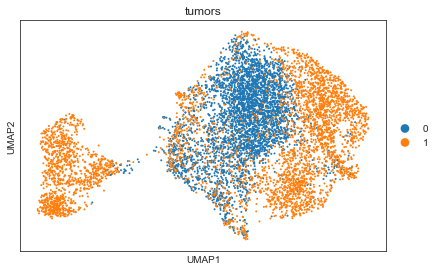

added attributes X_pca_sc and X_umap_sc


In [10]:
mb.pp.scanorama_recipe(adata,groups='tumors', correct = True)

In [11]:
adata

AnnData object with n_obs × n_vars = 7711 × 17050
    obs: 'tumors', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr'
    obsm: 'X_SC', 'X_pca_sc', 'X_umap_sc'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

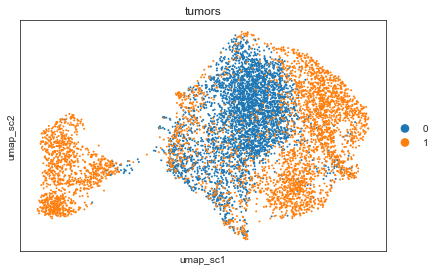

In [12]:
sc.pl.scatter(adata, basis = 'umap_sc', color = 'tumors')

## Cell Cycle Regression

calculating cell cycle phase


... storing 'phase' as categorical


-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


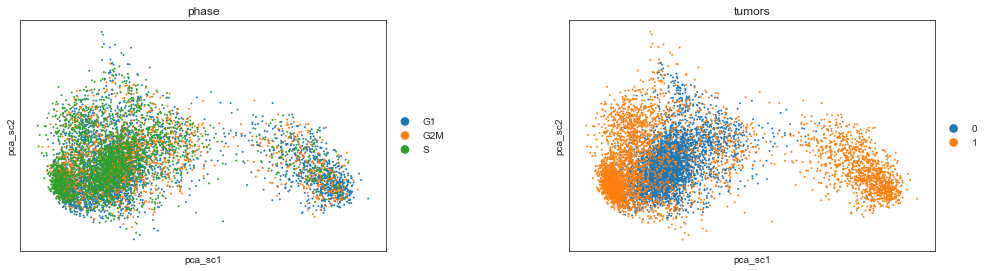

In [14]:
scv.tl.score_genes_cell_cycle(adata)
sc.pl.scatter(adata, color=['phase','tumors'], basis = 'pca_sc')

         Falling back to preprocessing with `sc.pp.pca` and default params.


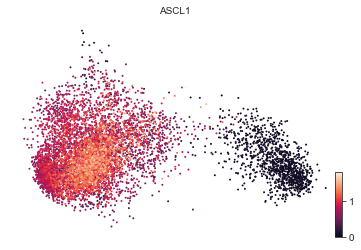

In [16]:
sc.pp.neighbors(adata)
scv.pl.scatter(adata, color='ASCL1', basis = 'pca_sc', smooth = True)

# Dimensionality Reduction and RNA Velocity

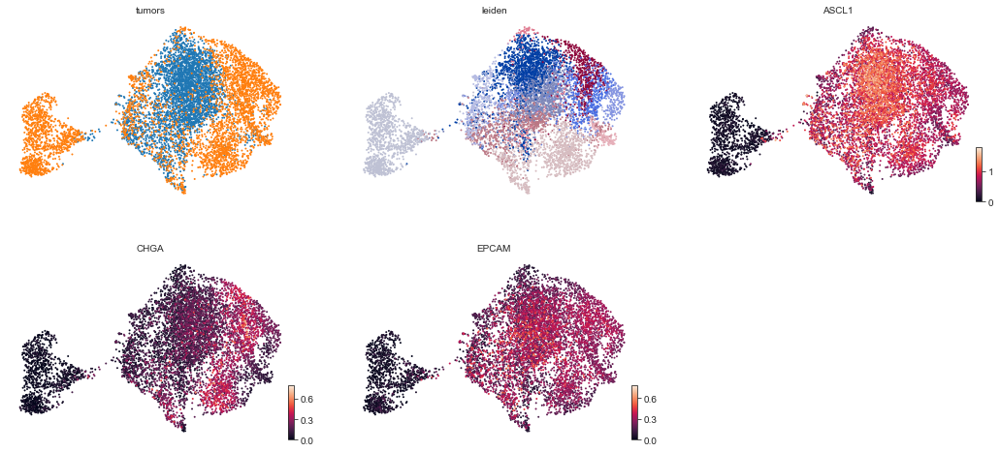

In [17]:
import matplotlib.pyplot as plt
adata.obsm['X_umap'] = adata.obsm['X_umap_sc']
sc.pp.neighbors(adata,use_rep='X_SC')
sc.tl.leiden(adata)
scv.pl.umap(adata, color = ['tumors','leiden','ASCL1','CHGA','EPCAM'], ncols = 3, smooth = True)


In [18]:
adata.write_h5ad('../int/byers/adata01.h5ad')

In [19]:
adata = sc.read_h5ad('../int/byers/adata01.h5ad')

## Calculating Velocity

In [19]:
scv.pp.moments(adata)
scv.tl.velocity(adata, mode = 'deterministic', groupby='tumors')
scv.tl.velocity_graph(adata)


computing neighbors
    finished (0:00:01) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:04) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:07) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:16:31) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


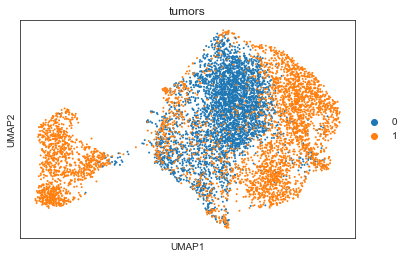

In [20]:
# sc.tl.tsne(adata, random_state=1)
sc.pl.umap(adata, color = 'tumors')

computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


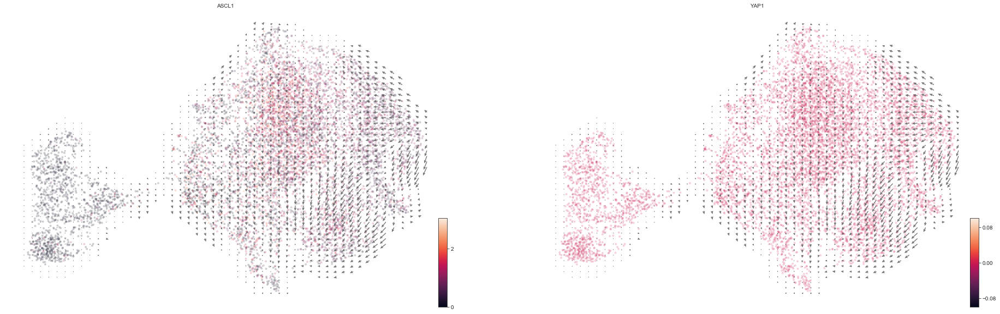

In [21]:
scv.pl.velocity_embedding_grid(adata, basis = 'umap', color = ['ASCL1','YAP1'], figsize = (16,10),
                                smooth =True)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


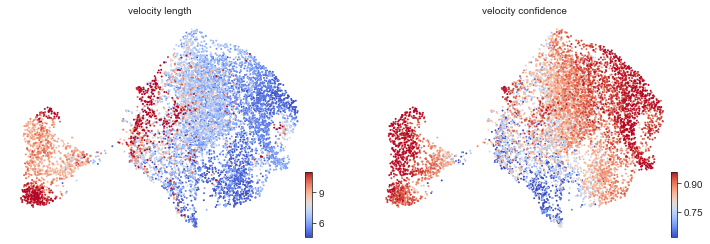

In [22]:
scv.tl.velocity_confidence(adata)

keys = 'velocity_length', 'velocity_confidence'  
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95], basis = 'umap')

Let's save the data at this point.

In [23]:
adata.write_h5ad('../int/byers/adata02.h5ad')

In [2]:
adata = sc.read_h5ad('../int/adata02.h5ad')

# Pseudotime and plasticity

We would like to see if we can get the same results as Ireland et al. did for their pseudotime analysis. To run Monocle2, we need the R interface `rpy2`. We'll also use the pseudotime inference within scvelo for comparison.

In [24]:
scv.tl.terminal_states(adata, groupby='tumors')

computing terminal states
    identified 4 regions of root cells and 2 regions of end points  (0).
    identified 4 regions of root cells and 2 regions of end points  (1).
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


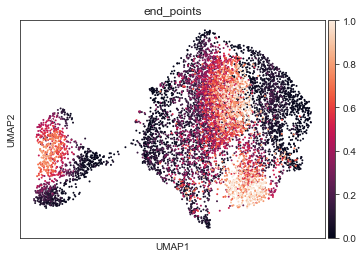

In [25]:
sc.pl.umap(adata, color="end_points")

### Velocity pseudotime

computing terminal states
    identified 6 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


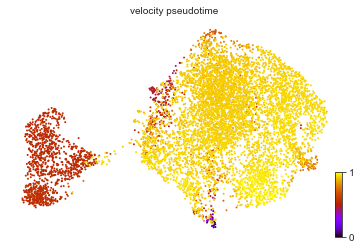

In [26]:
# Velocity pseudotime from scvelo
scv.tl.terminal_states(adata)
scv.tl.velocity_pseudotime(adata)
scv.pl.scatter(adata, color='velocity_pseudotime', cmap='gnuplot', basis = 'umap')

running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:03) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


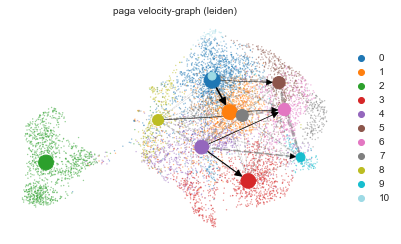

In [27]:
mb.ps.velocity_paga(adata, basis='umap')

In [28]:
adata.write_h5ad('../int/byers/adata03.h5ad')

In [3]:
adata = sc.read_h5ad('../int/adata03.h5ad')

### Calculate plasticity using CTrP

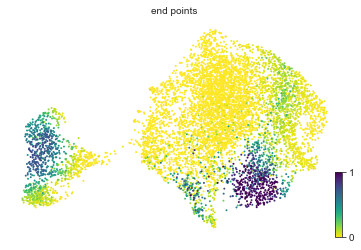

In [29]:
scv.pl.umap(adata, color = 'end_points')

In [30]:
mb.ps.ctrp(adata, self_transitions=False, groupby='tumors')

computing terminal states


Trying to set attribute `.obs` of view, copying.


Eigenvalues:  [1.0000017 0.9999984]
(3737, 2)
    identified 2 end points (0)
Dropping absorbing rows for fundamental matrix...
(3651, 3651)
Calculating fate...
Calculating distances...
Calculating inner product...


Trying to set attribute `.obs` of view, copying.


Eigenvalues:  [1.0000001 0.9999707]
(3974, 2)
    identified 2 end points (1)
Dropping absorbing rows for fundamental matrix...
(3882, 3882)
Calculating fate...
Calculating distances...
Calculating inner product...


In [31]:
adata

AnnData object with n_obs × n_vars = 7711 × 17050
    obs: 'tumors', 'n_genes', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'S_score', 'G2M_score', 'phase', 'leiden', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition', 'root_cells', 'end_points', 'velocity_pseudotime', 'ctrp', 'absorbing'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr', 'velocity_gamma_0', 'velocity_r2_0', 'velocity_genes_0', 'velocity_gamma_1', 'velocity_r2_1', 'velocity_genes_1'
    uns: 'tumors_colors', 'phase_colors', 'neighbors', 'leiden', 'leiden_colors', 'velocity_params', 'velocity_graph', 'velocity_graph_neg', 'paga', 'leiden_sizes'
    obsm: 'X_SC', 'X_pca_sc', 'X_umap_sc', 'X_pca', 'X_umap', 'velocity_umap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu', 'velocity'
    obsp: 'distances', 'connectivities'

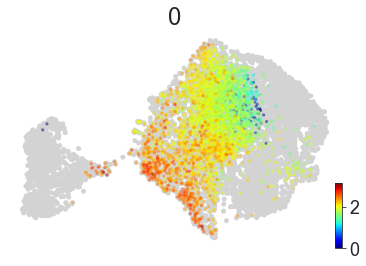

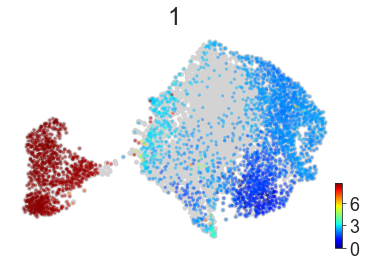

In [32]:
mb.pl.ctrp_groups(adata, groups = 'tumors', basis = 'umap')


0 1.9102088635645929
1 3.923896295386996


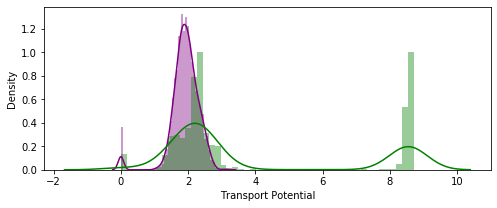

In [33]:
custom_palette = ['purple','green','#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']

mb.pl.ctrp_hist(adata, groups='tumors', bins = 50,figsize = (8,3), custom_palette=custom_palette,fname='pdx_hist_pheno')



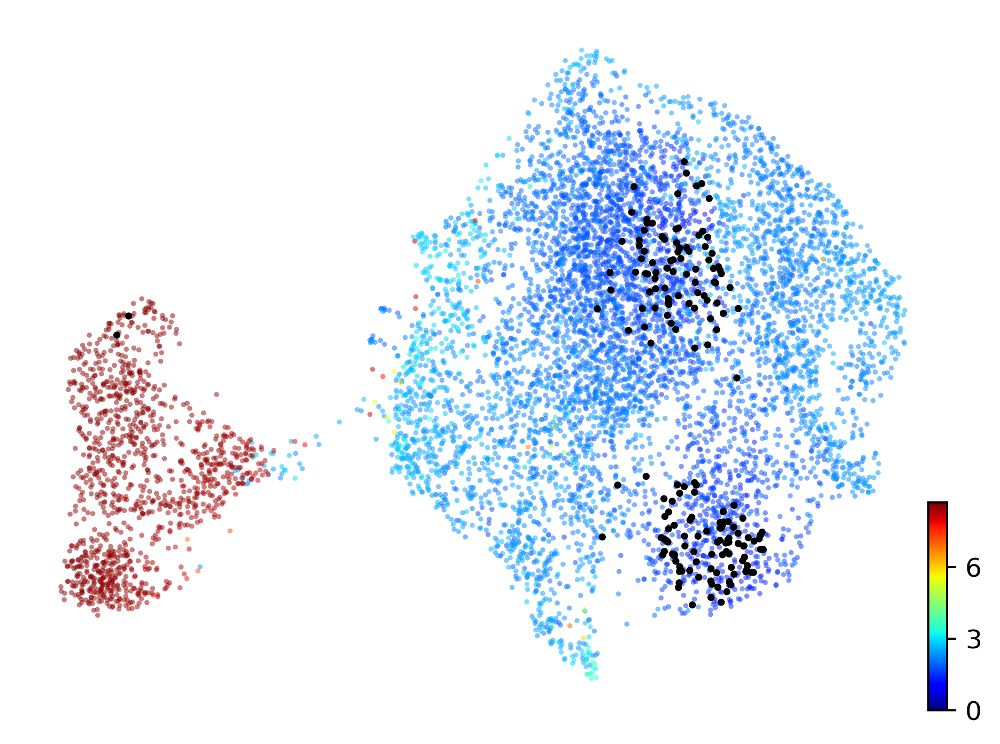

In [34]:
mb.pl.ctrp(adata, basis = 'umap')

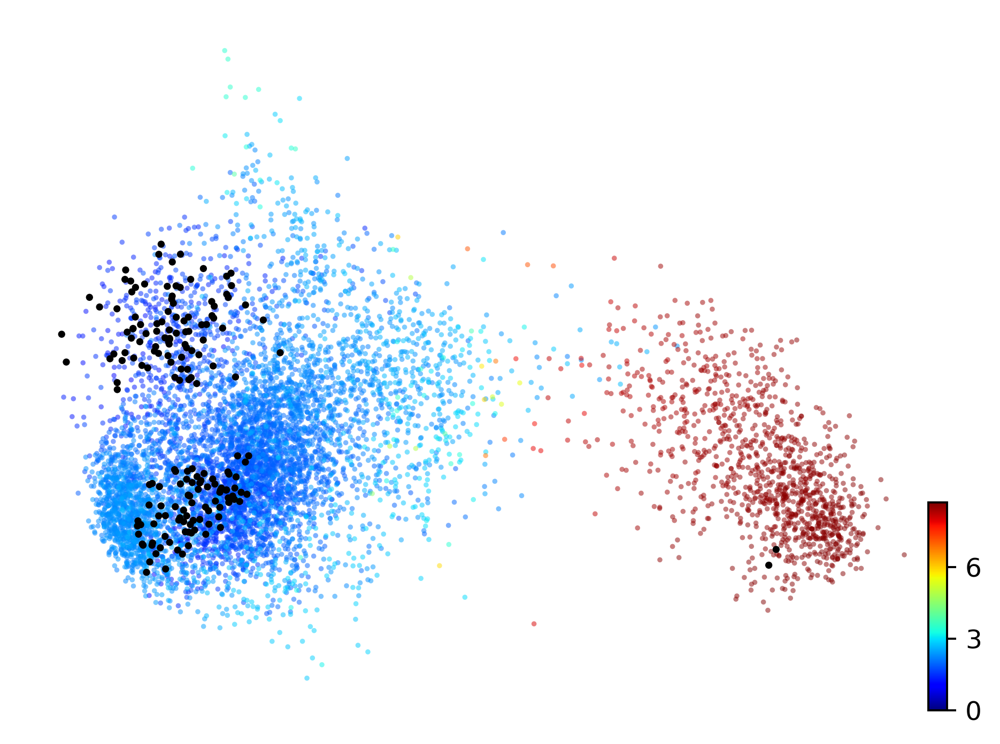

In [35]:
mb.pl.ctrp(adata, basis = 'pca_sc')

In [36]:
adata.write_h5ad('../int/byers/adata04.h5ad')

In [14]:
adata = sc.read_h5ad('../int/pdx/adata04.h5ad')

# Signature Subtyping

In [39]:
sig_matrix = pd.read_csv('../data/sig_matrix_ParTI.csv', header =0, index_col = 0)

sig_matrix = sig_matrix / np.linalg.norm(sig_matrix, axis=0)


In [38]:
sig_matrix.index = [i.upper() for i in sig_matrix.index]

In [41]:
outdir_ = './out/'

data, sig_matrix1, adata_small, lanorm = mb.ar.transform_tumor_space(adata, sig_matrix, unlog=False, scale=False, type = 'csr')


        # Transform velocity vectors
data_vel, sig_matrix2, adata_small = mb.ar.transform_vel(adata_small, sig_matrix1, scale=False, lanorm=lanorm)

# # Plot tumor data with velocity in cell type space
# for clust in range(4):
#     mb.pl.twodimplot_tumor(data=data,veldata= data_vel,adata= adata_small,gene_sig= sig_matrix2, celltype1 = clust, celltype2 = clust+1,
#                      save = False, dir_prefix = outdir_,
#                      tumor_clust_name='tumor')
#     mb.pl.twodimplot_tumor(data=data, veldata=data_vel, adata=adata_small, gene_sig=sig_matrix2, celltype1=clust, celltype2=clust + 1,
#                      save=False, dir_prefix=outdir_,
#                      meanonly = True, tumor_clust_name='cline')

Trying to set attribute `.obs` of view, copying.


Transforming tumor data...
Gene signature matrix now has shape:  (81, 5)
Tumor data shortened to genes in gene list...
(7567, 81)
Tumor data subsetting complete.


In [42]:
data.index = adata_small.obs_names
data.columns = sig_matrix.columns
for s in data:
    adata_small.obs[f"{s}_Score"] = data[s]
data_vel.index = adata_small.obs_names
data_vel.columns = sig_matrix.columns
for s in data_vel:
    adata_small.obs[f"{s}_Score_t1"] = data_vel[s] + data[s]

In [43]:
#filtered phenotype
pheno = []

for i,r in data.iterrows():
    test = r*(r>0)
    if test.max() < .1: pheno.append('None')

    elif test.max()>.5:
#     if (test/test.sum()).max()>.9:
        pheno.append(data.columns[test.argmax()])
    else: pheno.append('Generalist')
adata_small.obs['Phenotype'] = pheno

Index(['SCLC-A2_Score', 'SCLC-A_Score', 'SCLC-Y_Score'], dtype='object')


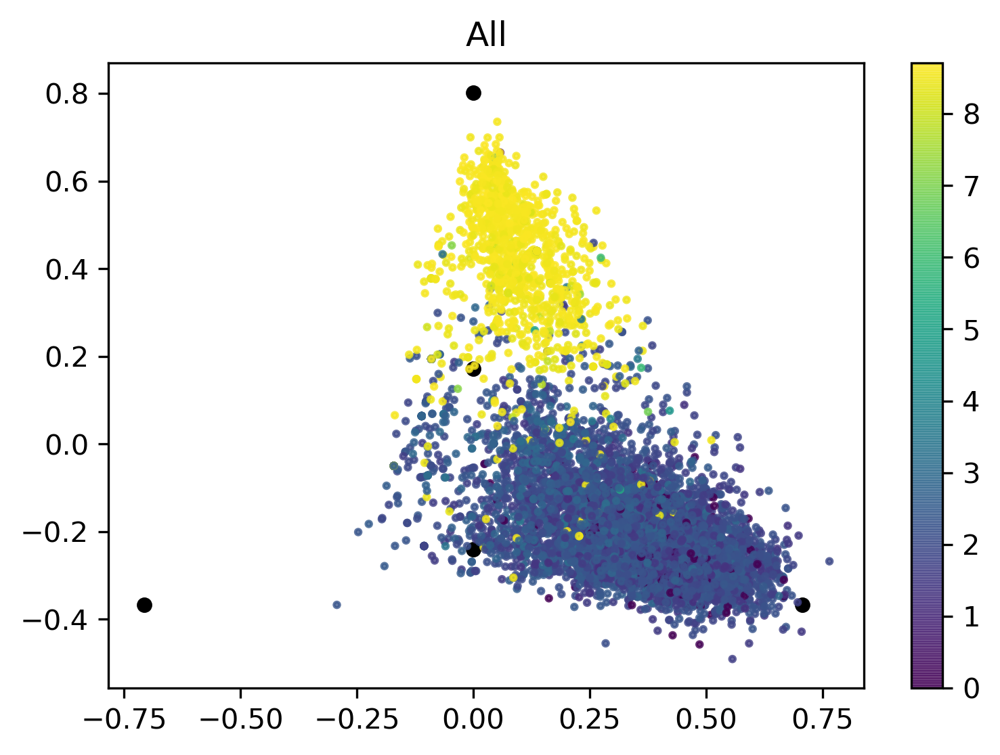

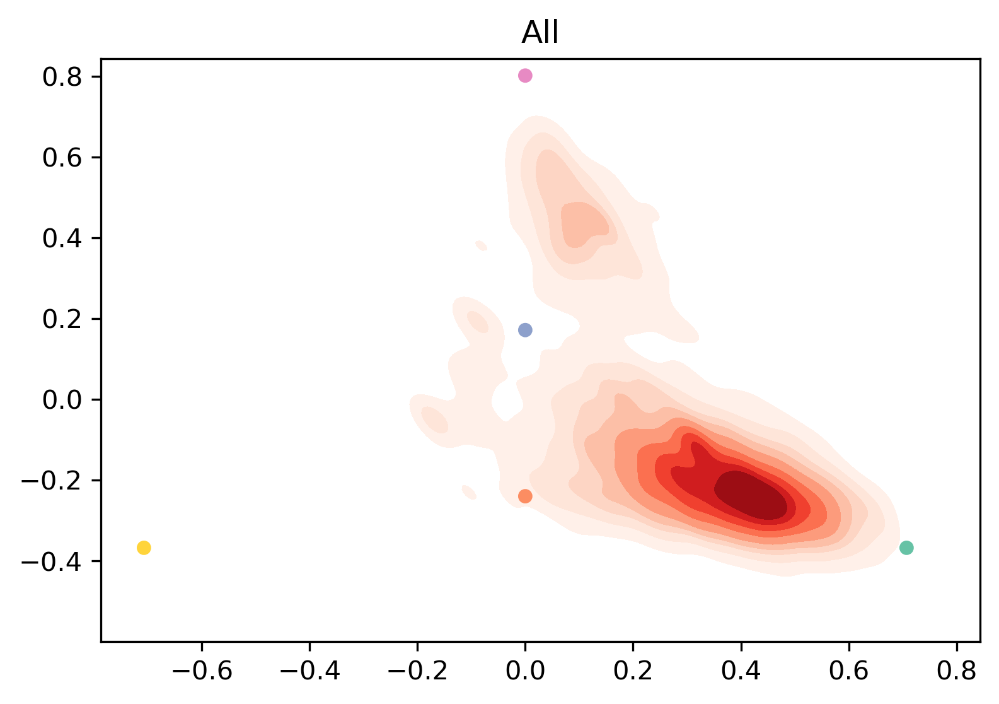

In [44]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='None',color='ctrp',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 40,
                        multiplier=1, figsize=(6,4), score_name = '_Score', alpha = .8, s = 4, sizes = 20)



0
Index(['SCLC-A2_Score', 'SCLC-A_Score', 'SCLC-Y_Score'], dtype='object')


No handles with labels found to put in legend.


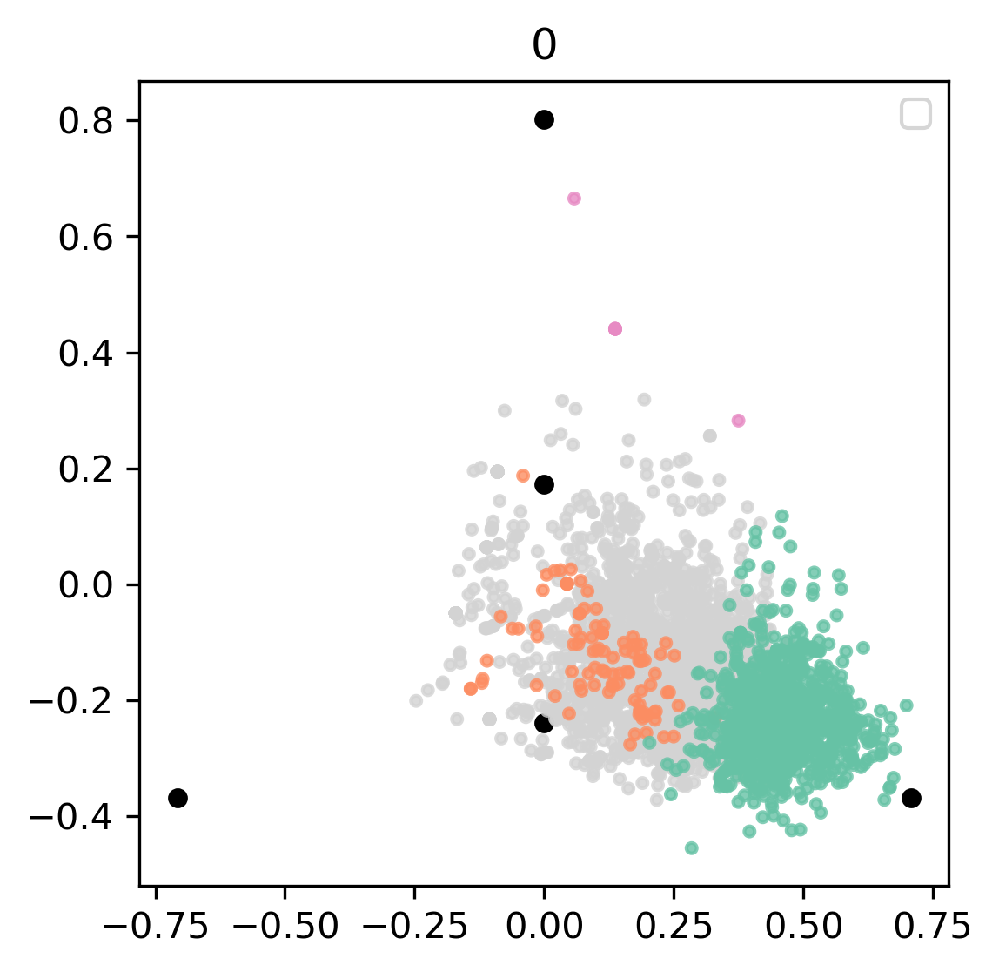

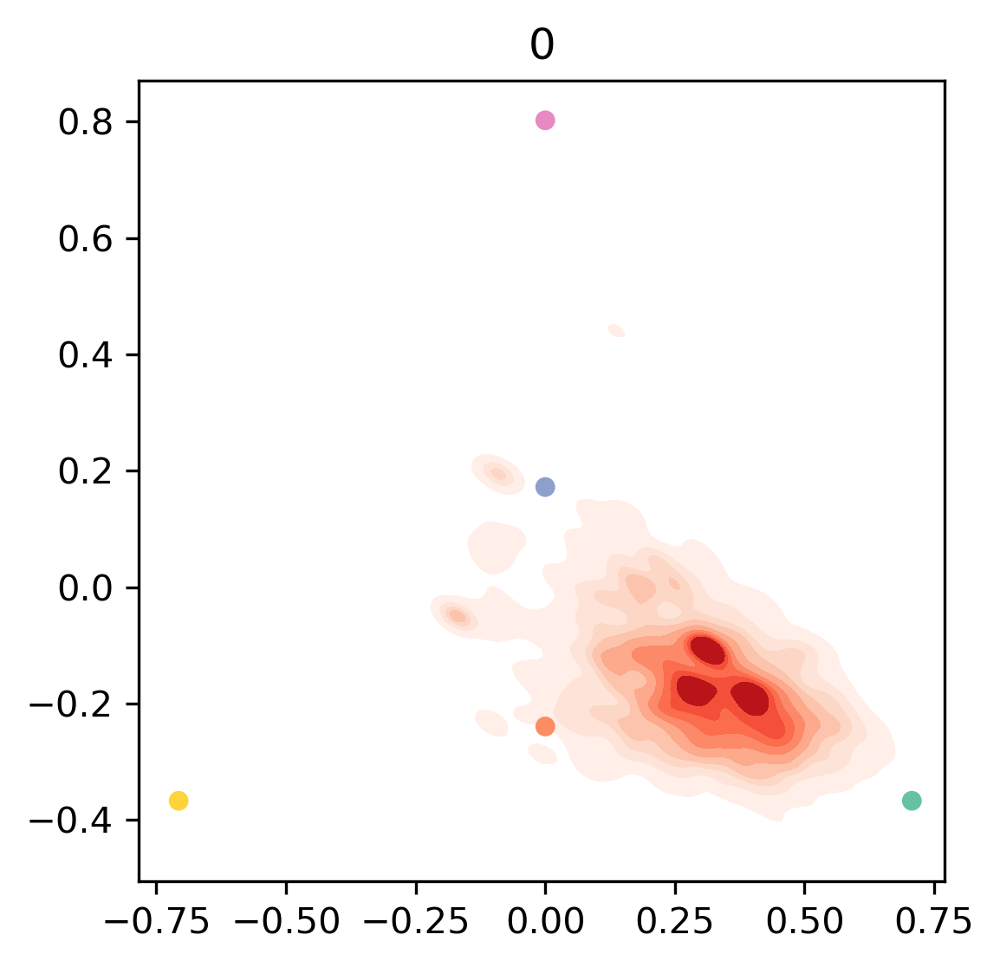

1
Index(['SCLC-A2_Score', 'SCLC-A_Score', 'SCLC-Y_Score'], dtype='object')


No handles with labels found to put in legend.


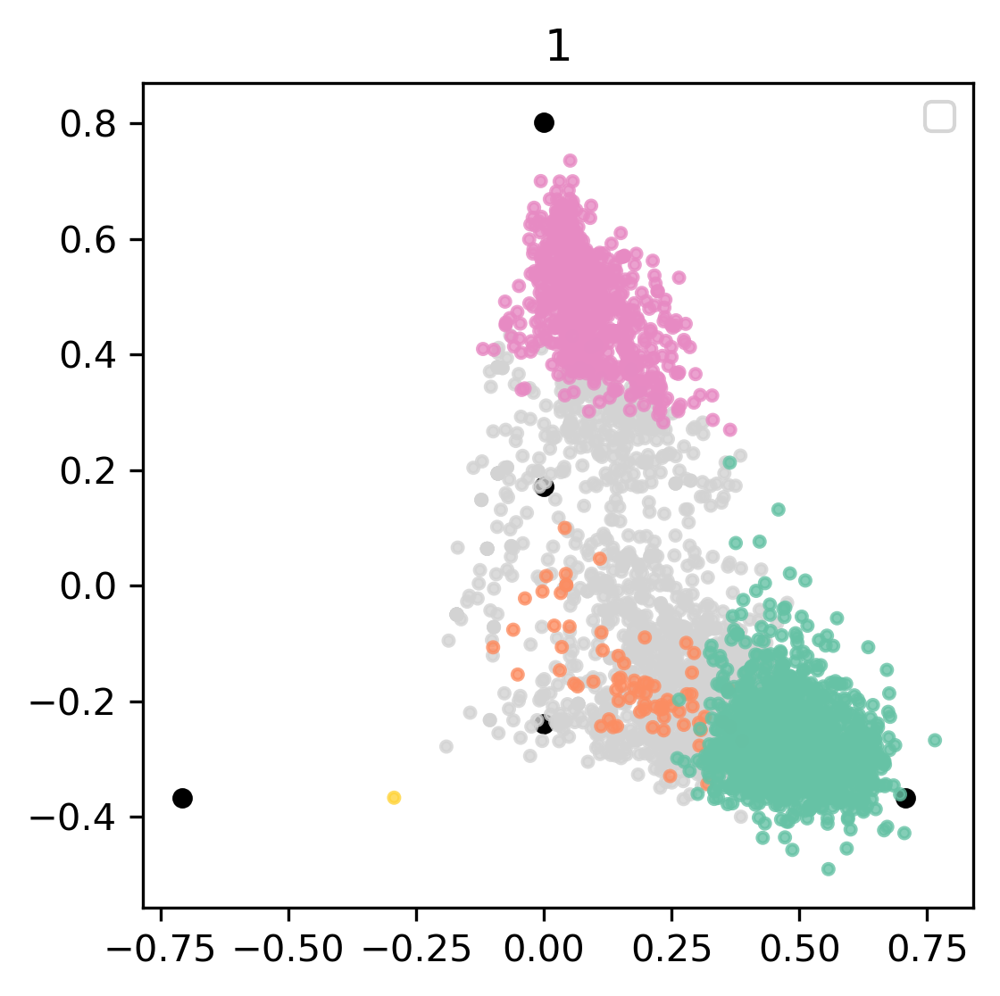

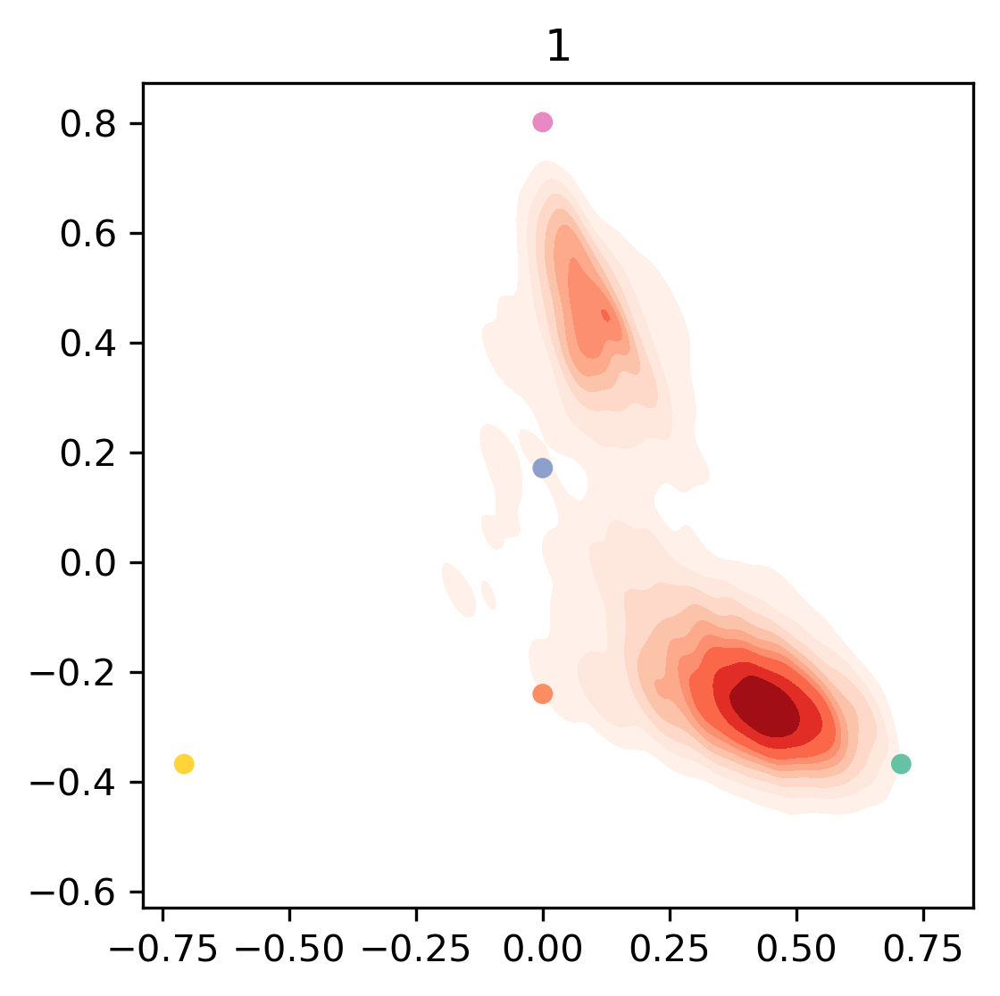

In [45]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'lightgrey', 'None': 'white'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='tumors',color = 'Phenotype',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',sizes = 20,
                        figsize=(4,4), score_name = '_Score', alpha = .8, s = 8, arrows = False)



0
Index(['SCLC-A2_Score', 'SCLC-A_Score', 'SCLC-Y_Score'], dtype='object')


No handles with labels found to put in legend.


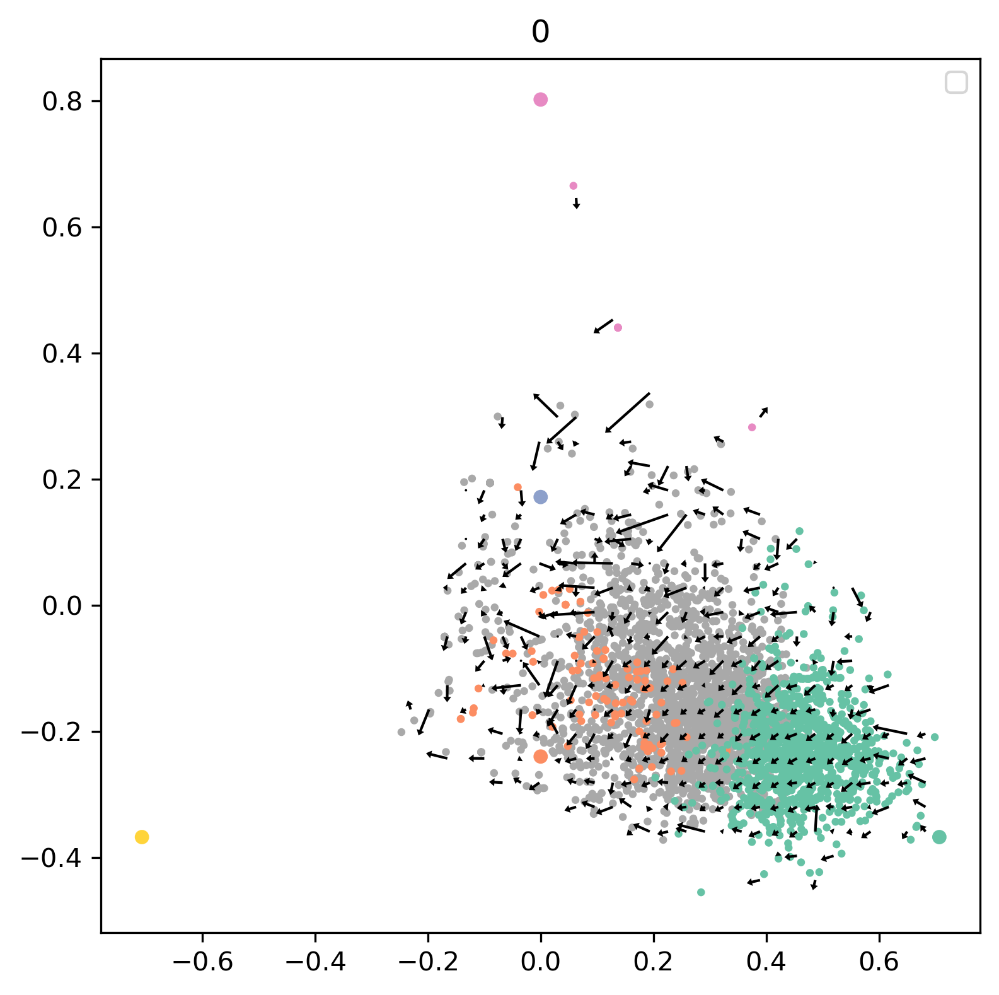

1
Index(['SCLC-A2_Score', 'SCLC-A_Score', 'SCLC-Y_Score'], dtype='object')


No handles with labels found to put in legend.


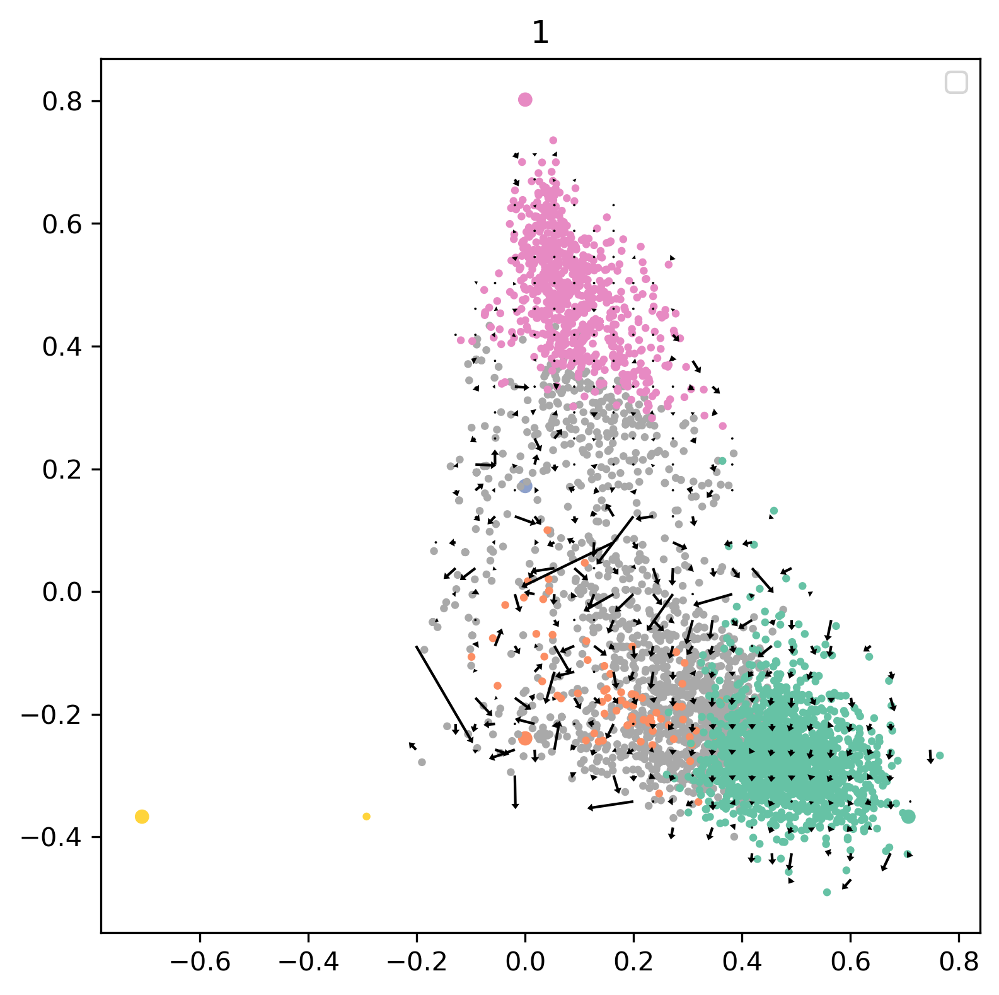

In [61]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'lightgrey'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='tumors',color='Phenotype',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',num_steps = 30,
                        multiplier=1, figsize=(6,6), score_name = '_Score', alpha = 1, s = 4, sizes = 20, arrows = True)



0
Index(['SCLC-A2_Score', 'SCLC-A_Score', 'SCLC-Y_Score'], dtype='object')


No handles with labels found to put in legend.


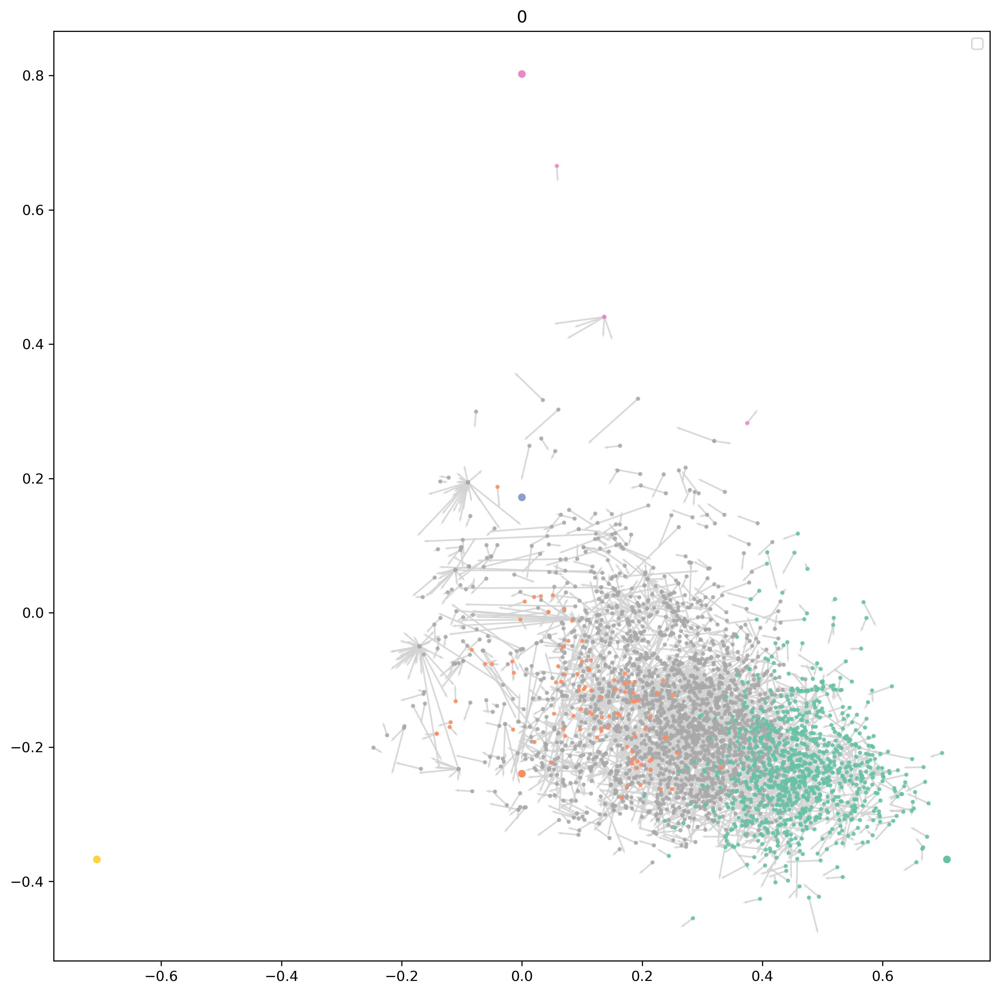

1
Index(['SCLC-A2_Score', 'SCLC-A_Score', 'SCLC-Y_Score'], dtype='object')


No handles with labels found to put in legend.


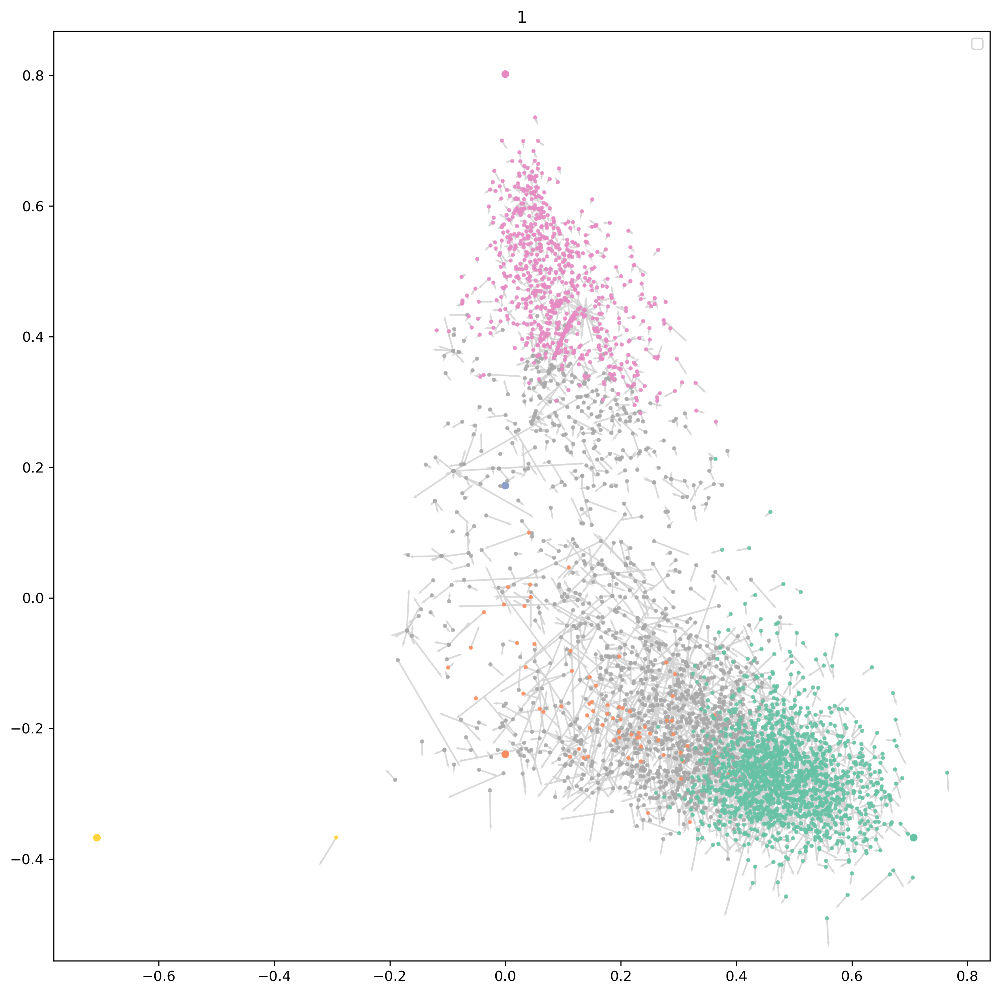

In [49]:
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300
cp = ['#fc8d62', '#66c2a5', '#FFD43B', '#8da0cb', '#e78ac3']
color_dict = {'SCLC-Y': cp[4], 'SCLC-A': cp[0], 'SCLC-A2': cp[1], 'SCLC-N': cp[2], 'SCLC-P': cp[3],
              'Generalist': 'darkgray', 'None': 'white'}
mb.pl.archetype_diagrams(adata_small, sig_matrix, color_dict=color_dict, groupby='tumors',color= 'Phenotype',
                        order = ['SCLC-Y','SCLC-A','SCLC-P','SCLC-N','SCLC-A2'], norm = 'None',grid = False,
                        multiplier=1, figsize=(12,12), score_name = '_Score', alpha = .8, s = 4, sizes = 20, arrows = True)



(<matplotlib.axes._subplots.AxesSubplot at 0x7fe3a1d0b5d0>,
 [<statannot.StatResult.StatResult at 0x7fe390650f10>])

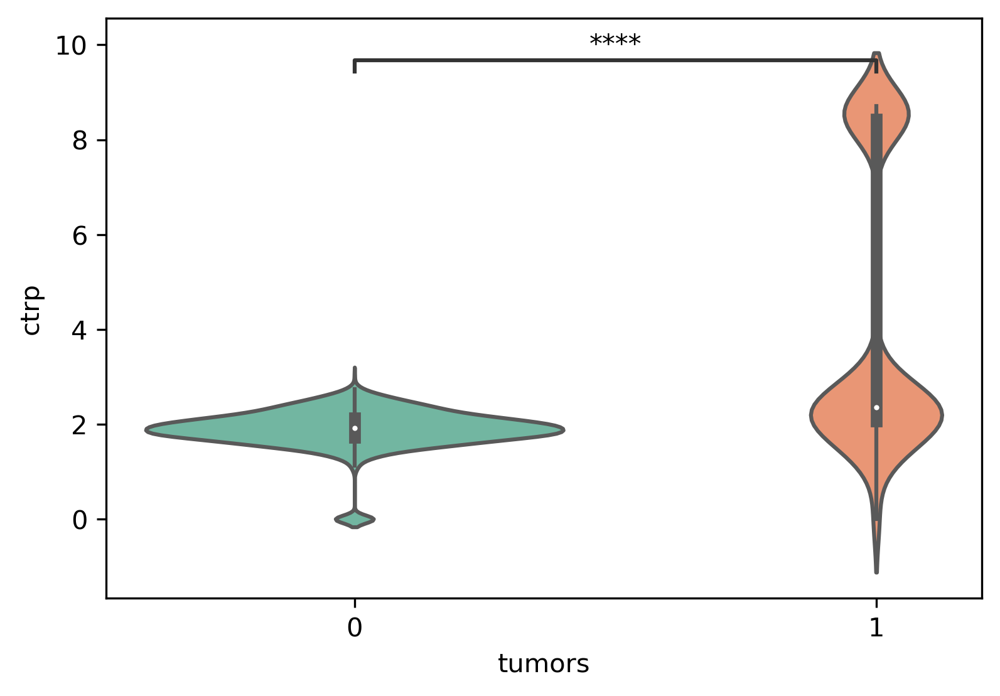

In [60]:
from statannot import add_stat_annotation
import seaborn as sns
plt.figure(figsize=(6,4))
ax = sns.violinplot(data = adata_small.obs, x='tumors',y = 'ctrp', palette = 'Set2')
add_stat_annotation(ax, data=adata_small.obs, x='tumors',y = 'ctrp',
                    box_pairs=[('0','1')],
                    test='Mann-Whitney', text_format='star', loc='inside', verbose=0)


(<matplotlib.axes._subplots.AxesSubplot at 0x7fe3b0e59e90>,
  <statannot.StatResult.StatResult at 0x7fe3a1ce5110>])

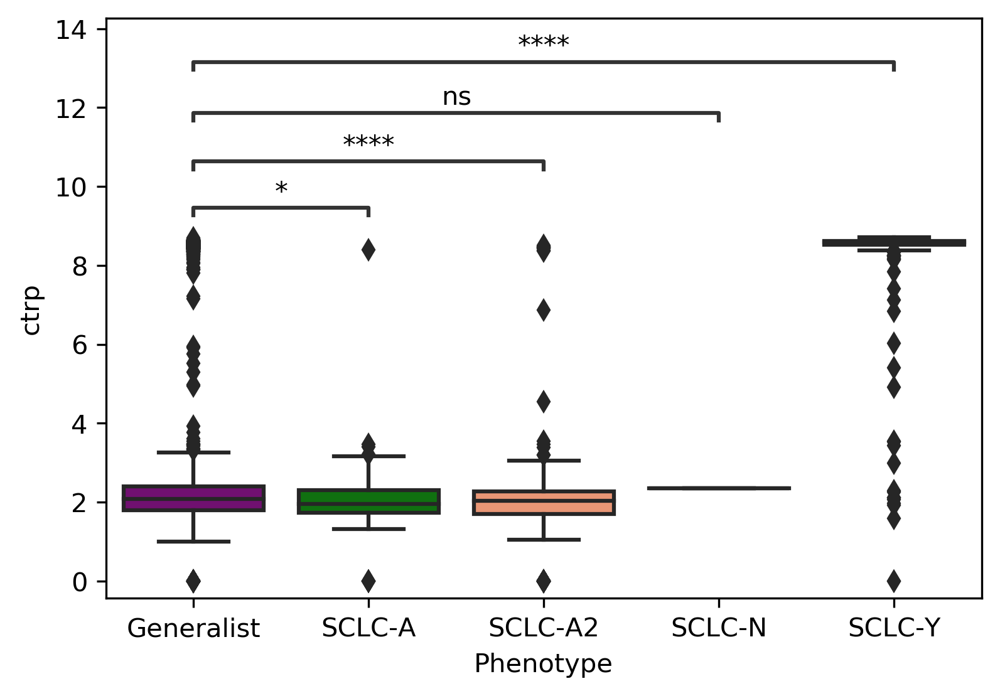

In [58]:
from statannot import add_stat_annotation
import seaborn as sns
plt.figure(figsize=(6,4))
ax = sns.boxplot(data = adata_small.obs, x='Phenotype',y = 'ctrp', order = sorted(list(set(adata_small.obs['Phenotype']))))
add_stat_annotation(ax, data=adata_small.obs, x='Phenotype',y = 'ctrp',order = sorted(list(set(adata_small.obs['Phenotype']))),
                    box_pairs=[('Generalist','SCLC-A'),('Generalist','SCLC-A2'),
                               ('Generalist','SCLC-N'),('Generalist','SCLC-Y')],
                    test='Mann-Whitney', text_format='star', loc='inside', verbose=0)


In [51]:
adata.write_h5ad('../int/byers/adata05.h5ad')

In [56]:
adata = sc.read_h5ad('../int/pdx/adata05.h5ad')

# Network inference: Imputation of time points

In [57]:
mb.pp.magic_recipe(adata, [i.capitalize() for i in tfs], 'Phenotype_filtered', fname='rpm')


Calculating MAGIC...
  Running MAGIC on 15257 cells and 21163 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 10.95 seconds.
    Calculating KNN search...
    Calculated KNN search in 33.19 seconds.
    Calculating affinities...
    Calculated affinities in 31.84 seconds.
  Calculated graph and diffusion operator in 76.00 seconds.
  Calculating imputation...
  Calculated imputation in 0.08 seconds.
Calculated MAGIC in 83.04 seconds.
Calculating PCA...
Calculated PCA in 9.02 seconds.
Calculating imputation...
Calculated imputation in 0.08 seconds.
